In [1]:
import pandas as pd
load_df = pd.read_csv('Load_history.csv')
load_df[load_df['zone_id'] == 20]

,zone_id,year,month,day,h1,h2,h3,h4,h5,h6,...,h15,h16,h17,h18,h19,h20,h21,h22,h23,h24
31350,20,2004,1,1,"79,830","77,429","75,558","75,709","77,475","77,854",...,"78,584","77,527","81,899","93,282","95,277","92,397","90,040","85,177","81,676","75,314"
31351,20,2004,1,2,"71,560","68,959","67,990","68,335","70,349","74,183",...,"78,850","76,054","77,075","87,835","91,773","89,731","87,168","83,197","81,111","74,229"
31352,20,2004,1,3,"68,593","65,101","63,455","63,204","65,326","66,637",...,"72,421","72,876","75,813","83,794","86,427","83,654","80,225","75,890","73,774","67,430"
31353,20,2004,1,4,"61,612","58,360","56,756","56,102","56,798","57,095",...,"72,375","71,782","75,228","84,540","86,587","84,950","81,403","75,835","70,960","63,402"
31354,20,2004,1,5,"58,361","56,728","56,488","57,276","60,227","67,197",...,"81,242","81,499","86,034","97,637","103,328","103,483","101,189","96,348","92,279","85,310"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32995,20,2008,7,3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32996,20,2008,7,4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32997,20,2008,7,5,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32998,20,2008,7,6,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:
import pandas as pd
import numpy as np

# 1. Load the original datasets
load_df = pd.read_csv('Load_history.csv')
temp_df = pd.read_csv('temperature_history.csv')

# 2. Clean Load History (Handling commas and converting to float)
hour_cols = [f'h{i}' for i in range(1, 25)]
for col in hour_cols:
    load_df[col] = load_df[col].astype(str).str.replace(',', '').replace('nan', np.nan).astype(float)

# 3. Create Zone 21 (Sum of Zones 1-20)
zone_21_df = load_df.groupby(['year', 'month', 'day'])[hour_cols].sum().reset_index()
zone_21_df['zone_id'] = 21

# Combine Zones 1-20 and Zone 21
load_combined = pd.concat([load_df, zone_21_df], axis=0, ignore_index=True)

# Transform Load to "Long Format"
load_long = load_combined.melt(
    id_vars=['zone_id', 'year', 'month', 'day'],
    value_vars=hour_cols,
    var_name='hour_label',
    value_name='load'
)
load_long['hour_num'] = load_long['hour_label'].str.extract(r'(\d+)').astype(int) - 1
load_long['ds'] = pd.to_datetime(load_long[['year', 'month', 'day']].assign(hour=load_long['hour_num']))

# 4. Handle Weights logic
# Base: Zone 21 is 20x more important than Zones 1-20
load_long['weight'] = load_long['zone_id'].apply(lambda x: 20.0 if x == 21 else 1.0)
# Forecast Multiplier: Final month (July 2008) gets 8x multiplier (1*8 or 20*8)
forecast_mask = (load_long['year'] == 2008) & (load_long['month'] == 7)
load_long.loc[forecast_mask, 'weight'] *= 8.0

# 5. Process Temperature History (Idea 1: All Stations)
temp_long = temp_df.melt(
    id_vars=['station_id', 'year', 'month', 'day'],
    value_vars=hour_cols,
    var_name='hour_label',
    value_name='temp'
)
temp_long['hour_num'] = temp_long['hour_label'].str.extract(r'(\d+)').astype(int) - 1
temp_long['ds'] = pd.to_datetime(temp_long[['year', 'month', 'day']].assign(hour=temp_long['hour_num']))

# Pivot temperature so each station is its own column
temp_all_stations = temp_long.pivot(index='ds', columns='station_id', values='temp')
temp_all_stations.columns = [f'temp_s{int(c)}' for c in temp_all_stations.columns]

# Merge Load and All Temperatures
df_master = pd.merge(load_long, temp_all_stations, on='ds', how='left')

# 6. Correlation Mapping (Idea 3: Find best station for each zone)
mapping = {}
temp_cols = [f'temp_s{i}' for i in range(1, 12)]

for zid in range(1, 22):
    zone_data = df_master[df_master['zone_id'] == zid]
    # Calculate correlation between load and each station's temperature
    corrs = [zone_data['load'].corr(zone_data[tcol]) for tcol in temp_cols]
    best_station_idx = np.argmax(np.abs(corrs)) + 1
    mapping[zid] = best_station_idx

# Add the Mapping columns to the master file
df_master['mapped_station_id'] = df_master['zone_id'].map(mapping)
df_master['mapped_temp'] = df_master.apply(lambda row: row[f"temp_s{int(row['mapped_station_id'])}"], axis=1)

# 7. Final Cleanup and Export
final_cols = ['zone_id', 'ds', 'load', 'weight'] + temp_cols + ['mapped_station_id', 'mapped_temp']
df_final = df_master[final_cols].sort_values(['zone_id', 'ds']).reset_index(drop=True)

df_final.to_csv('cleaned_load_history_with_weights.csv', index=False)

In [3]:
load_v2_df = pd.read_csv('cleaned_load_history_with_weights.csv')
print(load_v2_df.head())

   zone_id                   ds     load  weight  temp_s1  temp_s2  temp_s3  \
0        1  2004-01-01 00:00:00  16853.0     1.0     46.0     38.0     44.0   
1        1  2004-01-01 01:00:00  16450.0     1.0     46.0     36.0     42.0   
2        1  2004-01-01 02:00:00  16517.0     1.0     45.0     35.0     40.0   
3        1  2004-01-01 03:00:00  16873.0     1.0     41.0     30.0     36.0   
4        1  2004-01-01 04:00:00  17064.0     1.0     39.0     30.0     34.0   

   temp_s4  temp_s5  temp_s6  temp_s7  temp_s8  temp_s9  temp_s10  temp_s11  \
0     45.0     42.0     44.0     45.0     43.0     41.0      42.0      36.0   
1     43.0     42.0     43.0     44.0     44.0     39.0      43.0      32.0   
2     41.0     40.0     42.0     41.0     42.0     36.0      43.0      31.0   
3     37.0     39.0     38.0     40.0     34.0     35.0      39.0      30.0   
4     33.0     40.0     38.0     35.0     30.0     33.0      35.0      34.0   

   mapped_station_id  mapped_temp  
0             

In [4]:
load_v2_df['mapped_station_id'].unique()

array([ 2,  5,  8, 10,  4,  7])

In [5]:
import pandas as pd
import numpy as np

# 1. Load the master file we created
df = pd.read_csv('cleaned_load_history_with_weights.csv')
df['ds'] = pd.to_datetime(df['ds'])

# 2. Update Zone 21 LOAD (Sum of Zones 1-20)
# First, calculate the sums for every timestamp
system_sums = df[df['zone_id'] != 21].groupby('ds')['load'].sum().reset_index()

# Map these sums back into the rows where zone_id == 21
df.set_index('ds', inplace=True)
df.loc[df['zone_id'] == 21, 'load'] = system_sums.set_index('ds')['load']
df.reset_index(inplace=True)

# 3. Create Weighted Average Temperature for Zone 21
# We weight each station by how much 'load' its assigned zones typically carry.
# This makes Zone 21's temperature more realistic.
zone_weights = df[df['zone_id'] <= 20].groupby('zone_id')['load'].mean()
station_to_load_weight = df[df['zone_id'] <= 20].groupby('mapped_station_id')['zone_id'].apply(lambda x: zone_weights.loc[x].sum())

# Normalize weights so they sum to 1
station_weights = station_to_load_weight / station_to_load_weight.sum()

# Calculate the weighted average temp across all 11 stations
temp_cols = [f'temp_s{i}' for i in range(1, 12)]
df['weighted_avg_temp'] = 0
for s_id, weight in station_weights.items():
    df['weighted_avg_temp'] += df[f'temp_s{int(s_id)}'] * weight

# 4. Update mapped_temp and mapped_station_id for Zone 21
# For Zone 21, the "mapped_temp" should be this new weighted average
df.loc[df['zone_id'] == 21, 'mapped_temp'] = df.loc[df['zone_id'] == 21, 'weighted_avg_temp']
df.loc[df['zone_id'] == 21, 'mapped_station_id'] = 0  # 0 indicates 'System Weighted Average'

# 5. Final Cleanup and Export
df.drop(columns=['weighted_avg_temp'], inplace=True)
df.to_csv('final_training_data_v3.csv', index=False)

print("Zone 21 Updated successfully!")
print(df[df['zone_id'] == 21].head())

Zone 21 Updated successfully!
                        ds  zone_id       load  weight  temp_s1  temp_s2  \
792000 2004-01-01 00:00:00       21  1397668.0    20.0     46.0     38.0   
792001 2004-01-01 01:00:00       21  1351507.0    20.0     46.0     36.0   
792002 2004-01-01 02:00:00       21  1315742.0    20.0     45.0     35.0   
792003 2004-01-01 03:00:00       21  1308023.0    20.0     41.0     30.0   
792004 2004-01-01 04:00:00       21  1344117.0    20.0     39.0     30.0   

        temp_s3  temp_s4  temp_s5  temp_s6  temp_s7  temp_s8  temp_s9  \
792000     44.0     45.0     42.0     44.0     45.0     43.0     41.0   
792001     42.0     43.0     42.0     43.0     44.0     44.0     39.0   
792002     40.0     41.0     40.0     42.0     41.0     42.0     36.0   
792003     36.0     37.0     39.0     38.0     40.0     34.0     35.0   
792004     34.0     33.0     40.0     38.0     35.0     30.0     33.0   

        temp_s10  temp_s11  mapped_station_id  mapped_temp  
792000      4

In [6]:
import pandas as pd

# 1. Load your existing data
df = pd.read_csv('final_training_data_v3.csv')
df['ds'] = pd.to_datetime(df['ds'])

# 2. Define your Holiday List
# You can replace this list with the specific dates you have.
holidays = [
    '2004-01-01', '2004-01-19', '2004-02-16', '2004-05-31', '2004-07-04', '2004-09-06', '2004-10-11', '2004-11-11', '2004-11-25', '2004-12-25',
    '2005-01-01', '2005-01-17', '2005-02-21', '2005-05-30', '2005-07-04', '2005-09-05', '2005-10-10', '2005-11-11', '2005-11-24', '2005-12-25',
    '2006-01-01', '2006-01-16', '2006-02-20', '2006-05-29', '2006-07-04', '2006-09-04', '2006-10-09', '2006-11-11', '2006-11-23', '2006-12-25',
    '2007-01-01', '2007-01-15', '2007-02-19', '2007-05-28', '2007-07-04', '2007-09-03', '2007-10-08', '2007-11-11', '2007-11-22', '2007-12-25',
    '2008-01-01', '2008-01-21', '2008-02-18', '2008-05-26', '2008-07-04', '2008-09-01', '2008-10-13', '2008-11-11', '2008-11-27', '2008-12-25'
]

# Convert strings to date objects for matching
holiday_dates = pd.to_datetime(holidays).date

# 3. Create the 'is_holiday' column (1 if holiday, 0 if not)
df['is_holiday'] = df['ds'].dt.date.isin(holiday_dates).astype(int)

# 4. Add "Context" features (very important for holiday logic)
df['day_of_week'] = df['ds'].dt.dayofweek   # 0=Monday, 6=Sunday
df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)

# 5. Save the final version
df.to_csv('final_training_data_v4.csv', index=False)

print("Holidays, Day of Week, and Weekend flags added successfully!")

Holidays, Day of Week, and Weekend flags added successfully!


In [7]:
h_df = pd.read_csv('final_training_data_v4.csv')
print(h_df.head())

                    ds  zone_id     load  weight  temp_s1  temp_s2  temp_s3  \
0  2004-01-01 00:00:00        1  16853.0     1.0     46.0     38.0     44.0   
1  2004-01-01 01:00:00        1  16450.0     1.0     46.0     36.0     42.0   
2  2004-01-01 02:00:00        1  16517.0     1.0     45.0     35.0     40.0   
3  2004-01-01 03:00:00        1  16873.0     1.0     41.0     30.0     36.0   
4  2004-01-01 04:00:00        1  17064.0     1.0     39.0     30.0     34.0   

   temp_s4  temp_s5  temp_s6  temp_s7  temp_s8  temp_s9  temp_s10  temp_s11  \
0     45.0     42.0     44.0     45.0     43.0     41.0      42.0      36.0   
1     43.0     42.0     43.0     44.0     44.0     39.0      43.0      32.0   
2     41.0     40.0     42.0     41.0     42.0     36.0      43.0      31.0   
3     37.0     39.0     38.0     40.0     34.0     35.0      39.0      30.0   
4     33.0     40.0     38.0     35.0     30.0     33.0      35.0      34.0   

   mapped_station_id  mapped_temp  is_holiday  day

In [8]:
import pandas as pd
import numpy as np

# 1. Load your data
df = pd.read_csv('final_training_data_v4.csv')

# --- METHOD A: ONE-HOT ENCODING (Recommended for XGBoost) ---
# This creates columns: day_0, day_1, day_2, etc.
df = pd.get_dummies(df, columns=['day_of_week'], prefix='day')

# --- METHOD B: CYCLICAL ENCODING (Recommended for Deep Learning/Linear Models) ---
# We map the 7 days (0-6) onto a circle
#df['day_sin'] = np.sin(2 * np.pi * df['day_of_week'] / 7)
#df['day_cos'] = np.cos(2 * np.pi * df['day_of_week'] / 7)

# 3. Export the model-ready file
df.to_csv('final_training_data_model_ready.csv', index=False)

print("Categorical encoding complete!")
print(df)

Categorical encoding complete!
                         ds  zone_id     load  weight  temp_s1  temp_s2  \
0       2004-01-01 00:00:00        1  16853.0     1.0     46.0     38.0   
1       2004-01-01 01:00:00        1  16450.0     1.0     46.0     36.0   
2       2004-01-01 02:00:00        1  16517.0     1.0     45.0     35.0   
3       2004-01-01 03:00:00        1  16873.0     1.0     41.0     30.0   
4       2004-01-01 04:00:00        1  17064.0     1.0     39.0     30.0   
...                     ...      ...      ...     ...      ...      ...   
831595  2008-07-07 19:00:00       21      0.0   160.0      NaN      NaN   
831596  2008-07-07 20:00:00       21      0.0   160.0      NaN      NaN   
831597  2008-07-07 21:00:00       21      0.0   160.0      NaN      NaN   
831598  2008-07-07 22:00:00       21      0.0   160.0      NaN      NaN   
831599  2008-07-07 23:00:00       21      0.0   160.0      NaN      NaN   

        temp_s3  temp_s4  temp_s5  temp_s6  ...  mapped_temp  is_hol

Generating Pillar 2 plots for all zones...


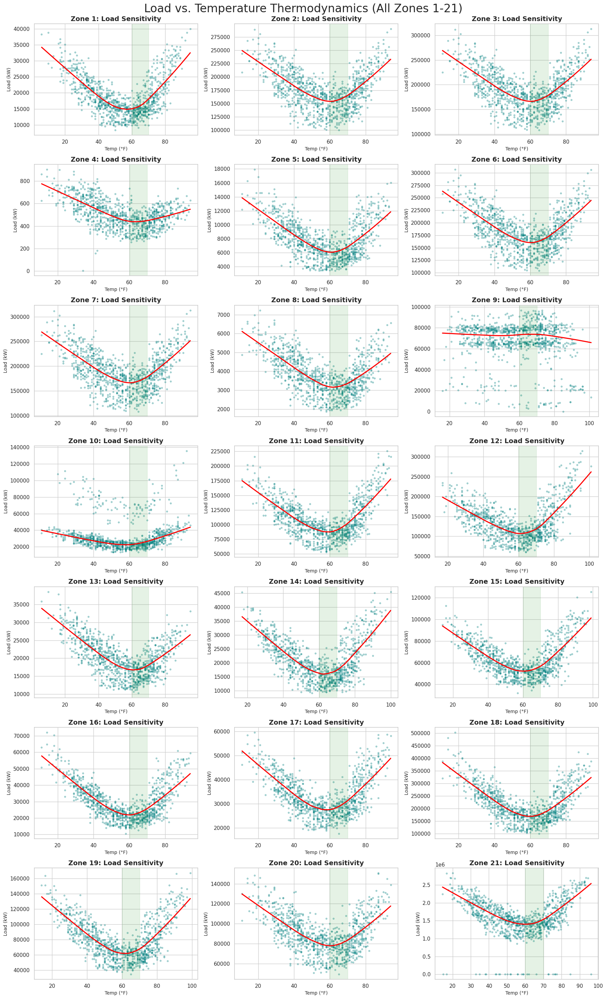

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('final_training_data_model_ready.csv')
df['ds'] = pd.to_datetime(df['ds'])
mapped_temp = df['mapped_temp']

# Create a figure and axis
# Set the aesthetic style
sns.set_theme(style="whitegrid")

# Create a figure with 21 subplots (7 rows x 3 columns)
# Adjust figsize for a vertical "gallery" layout suitable for a technical report/presentation
fig, axes = plt.subplots(7, 3, figsize=(18, 30))
axes = axes.flatten()

print("Generating Pillar 2 plots for all zones...")

for i, zone_id in enumerate(range(1, 22)):
    # Filter data for the specific zone and remove nulls for plotting
    zone_data = df[df['zone_id'] == zone_id].dropna(subset=['load', 'mapped_temp'])

    # Sample points for visual clarity (1000 points is usually enough to see the trend)
    sample_size = min(len(zone_data), 1000)
    zone_sample = zone_data.sample(sample_size, random_state=42)

    # Create the regression plot with LOWESS smoothing to capture the non-linear U-curve
    sns.regplot(
        data=zone_sample,
        x='mapped_temp',
        y='load',
        ax=axes[i],
        scatter_kws={'alpha': 0.3, 'color': 'teal', 's': 10},
        line_kws={'color': 'red'},
        lowess=True
    )

    # Highlight the "Comfort Zone" (roughly 60-70°F) where load is typically lowest
    axes[i].axvspan(60, 70, color='green', alpha=0.1)

    # Formatting each subplot
    axes[i].set_title(f'Zone {zone_id}: Load Sensitivity', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Temp (°F)', fontsize=10)
    axes[i].set_ylabel('Load (kW)', fontsize=10)

# Final layout adjustments
plt.tight_layout()
plt.subplots_adjust(top=0.96) # Make room for the main title
fig.suptitle('Load vs. Temperature Thermodynamics (All Zones 1-21)', fontsize=24)

# Save the high-resolution output for the presentation
plt.savefig('thermodynamics_all_zones.png', bbox_inches='tight', dpi=300)
plt.show()

/tmp/ipython-input-667758346.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=z21_clean, x='day_of_week', y='load', palette='viridis')


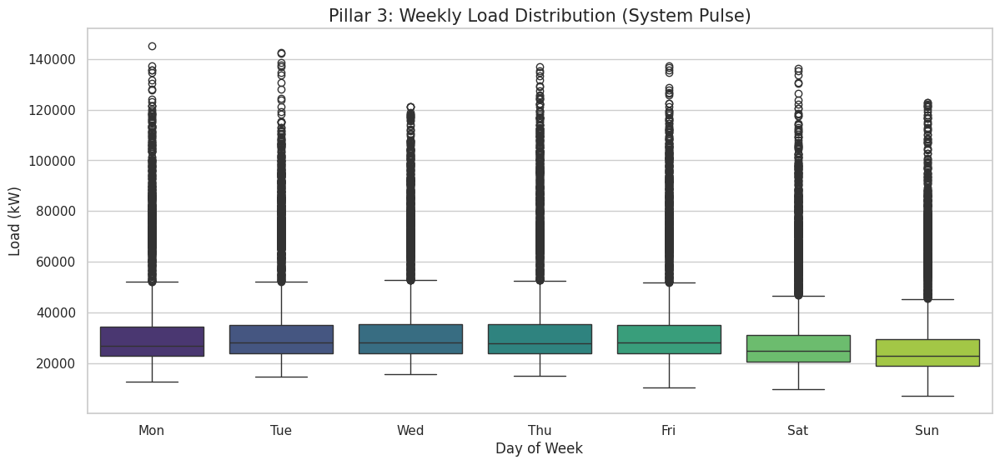

/tmp/ipython-input-667758346.py:24: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(data=z21_clean, x='is_holiday', y='load', ci='sd', palette='Set2')
/tmp/ipython-input-667758346.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=z21_clean, x='is_holiday', y='load', ci='sd', palette='Set2')


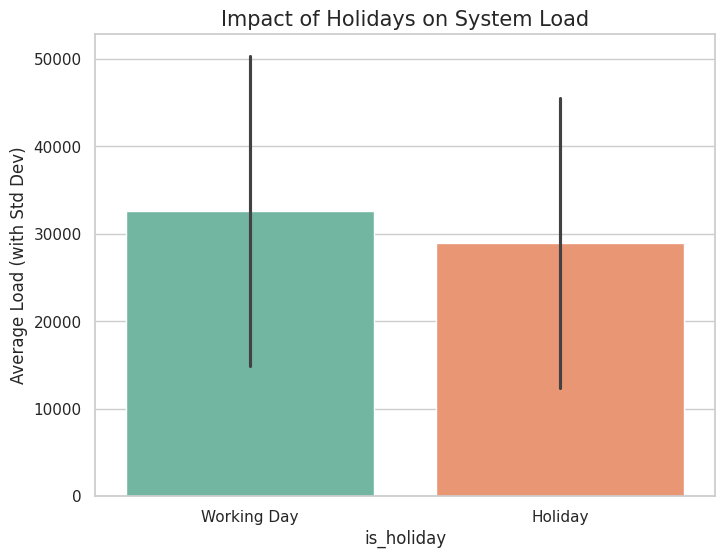

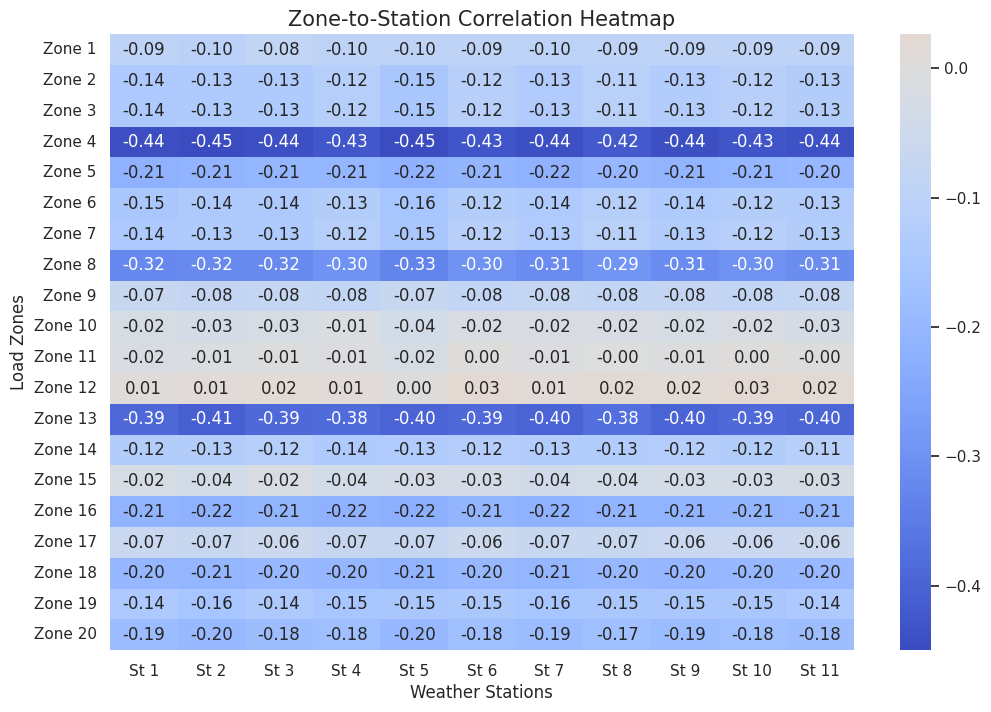

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load data
df = pd.read_csv('final_training_data_v4.csv')
df['ds'] = pd.to_datetime(df['ds'])

# 1. PILLAR 3: WEEKLY BEHAVIOR (Boxplots)
plt.figure(figsize=(14, 6))
# Filter to Zone 21 for a clear system view
z21_clean = df[(df['zone_id'] == 10) & (df['load'].notnull())]

sns.boxplot(data=z21_clean, x='day_of_week', y='load', palette='viridis')
plt.title('Pillar 3: Weekly Load Distribution (System Pulse)', fontsize=15)
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.ylabel('Load (kW)')
plt.xlabel('Day of Week')
plt.show()

# HOLIDAY IMPACT COMPARISON
plt.figure(figsize=(8, 6))
sns.barplot(data=z21_clean, x='is_holiday', y='load', ci='sd', palette='Set2')
plt.title('Impact of Holidays on System Load', fontsize=15)
plt.xticks(ticks=[0, 1], labels=['Working Day', 'Holiday'])
plt.ylabel('Average Load (with Std Dev)')
plt.show()

# 2. PILLAR 4: SPATIAL MAPPING (Correlation Heatmap)
plt.figure(figsize=(12, 8))

# Calculate correlation between the 20 zones and 11 stations
temp_cols = [f'temp_s{i}' for i in range(1, 12)]
zone_ids = range(1, 21)

# Initialize a matrix to store correlations
corr_matrix = np.zeros((20, 11))

for i, zid in enumerate(zone_ids):
    zone_data = df[df['zone_id'] == zid]
    for j, tcol in enumerate(temp_cols):
        # Using absolute correlation because both high heat and high cold increase load
        corr_matrix[i, j] = zone_data['load'].corr(zone_data[tcol])

corr_df = pd.DataFrame(corr_matrix, index=[f'Zone {i}' for i in zone_ids], columns=[f'St {i}' for i in range(1, 12)])

sns.heatmap(corr_df, annot=True, fmt=".2f", cmap='coolwarm', center=0)
plt.title('Zone-to-Station Correlation Heatmap', fontsize=15)
plt.xlabel('Weather Stations')
plt.ylabel('Load Zones')
plt.show()

correlations are low, so lets consider average temperature instead of mapped.

Generating Pillar 3 (Weekly Pulse) for all zones...


/tmp/ipython-input-376451137.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-376451137.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-376451137.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-376451137.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-376451137.py:30: FutureWarning: 

Passing `pa

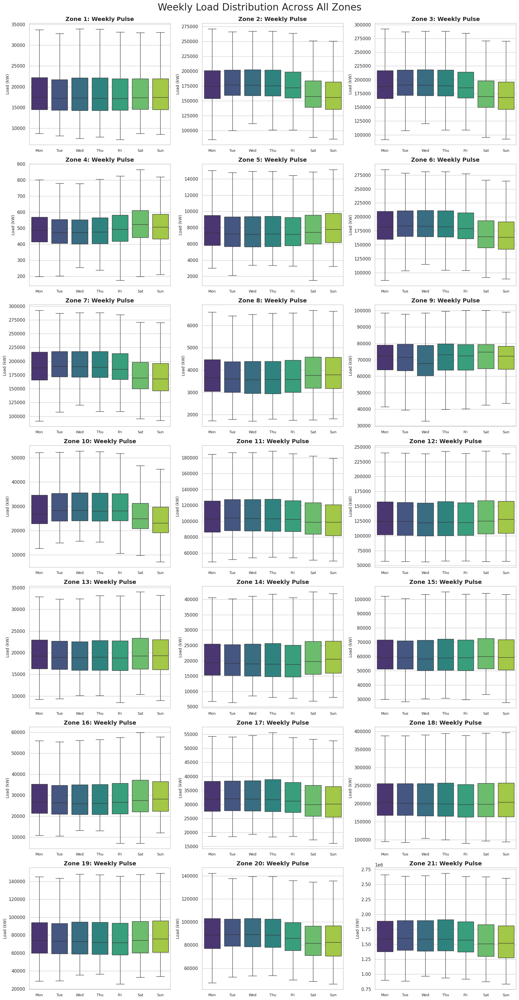

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load data
df = pd.read_csv('final_training_data_v4.csv')
df['ds'] = pd.to_datetime(df['ds'])

# Ensure we have a day_of_week column (0=Mon, 6=Sun)
if 'day_of_week' not in df.columns:
    df['day_of_week'] = df['ds'].dt.dayofweek

# Set the aesthetic style
sns.set_theme(style="whitegrid")

# 2. Create a figure with 21 subplots (7 rows x 3 columns)
fig, axes = plt.subplots(7, 3, figsize=(18, 35))
axes = axes.flatten()

print("Generating Pillar 3 (Weekly Pulse) for all zones...")

# Define day labels for the x-axis
day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

for i, zone_id in enumerate(range(1, 22)):
    # Filter for the specific zone
    zone_data = df[df['zone_id'] == zone_id].dropna(subset=['load'])

    # Create boxplot
    sns.boxplot(
        data=zone_data,
        x='day_of_week',
        y='load',
        ax=axes[i],
        palette='viridis',
        showfliers=False # Optional: hides outliers for a cleaner look in a big grid
    )

    # Formatting each subplot
    axes[i].set_title(f'Zone {zone_id}: Weekly Pulse', fontsize=14, fontweight='bold')
    axes[i].set_xticks(range(7))
    axes[i].set_xticklabels(day_labels, fontsize=9)
    axes[i].set_ylabel('Load (kW)', fontsize=10)
    axes[i].set_xlabel('') # Hide x-label to reduce clutter

# 3. Final layout adjustments
plt.tight_layout()
plt.subplots_adjust(top=0.96) # Adjust for title
fig.suptitle('Weekly Load Distribution Across All Zones', fontsize=24)

# Save the high-resolution output
plt.savefig('pillar_3_weekly_pulse_all_zones.png', bbox_inches='tight', dpi=300)
plt.show()

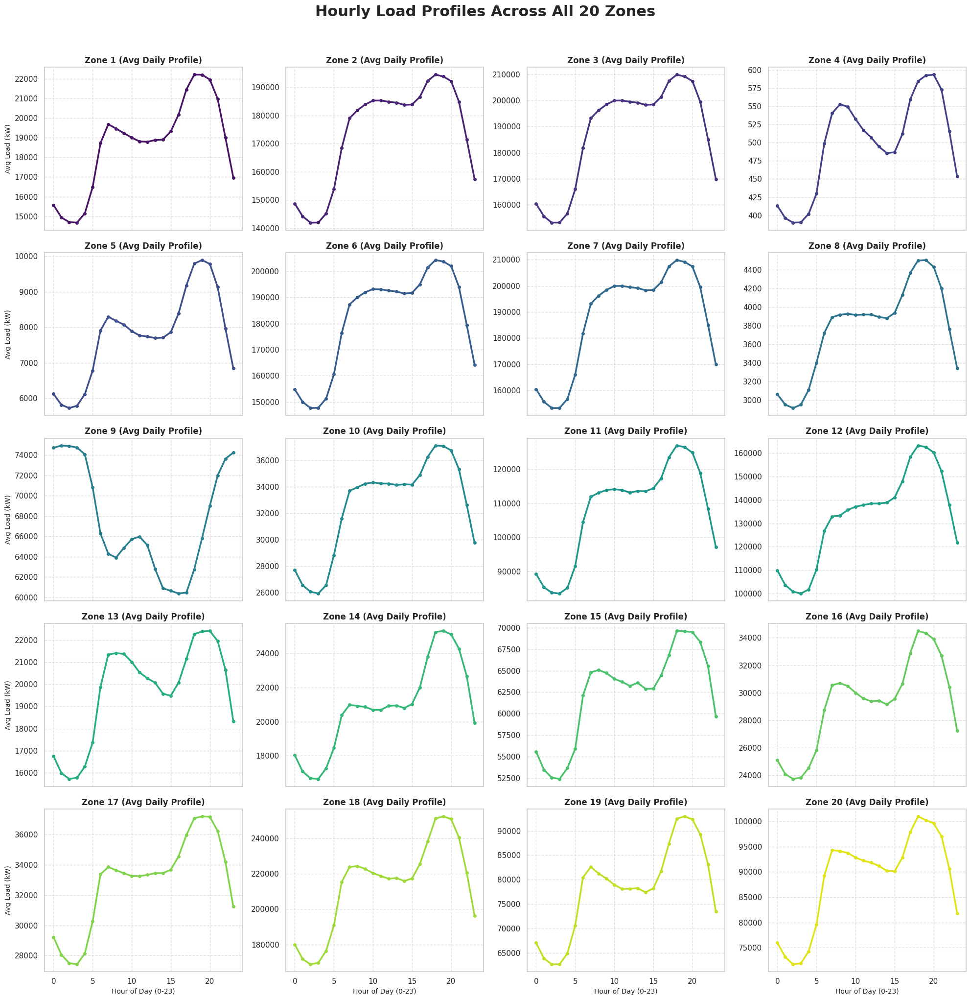

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load and Prepare
df = pd.read_csv('final_training_data_model_ready.csv')
df['ds'] = pd.to_datetime(df['ds'])
df['hour'] = df['ds'].dt.hour

# 2. Calculate Hourly Average per Zone
# We group by zone and hour, then take the mean load
hourly_avg = df.groupby(['zone_id', 'hour'])['load'].mean().reset_index()

# 3. Plotting for Zones 1-20
fig, axes = plt.subplots(5, 4, figsize=(20, 20), sharex=True)
axes = axes.flatten()

# Use a professional color palette
colors = sns.color_palette("viridis", 20)

for i, zid in enumerate(range(1, 21)):
    # Filter data for the specific zone
    zone_data = hourly_avg[hourly_avg['zone_id'] == zid]

    # Plot the 24-hour cycle
    axes[i].plot(zone_data['hour'], zone_data['load'],
                 color=colors[i], linewidth=2.5, marker='o', markersize=4)

    # Formatting each subplot
    axes[i].set_title(f'Zone {zid} (Avg Daily Profile)', fontsize=12, fontweight='bold')
    axes[i].grid(True, linestyle='--', alpha=0.6)

    if i % 4 == 0:
        axes[i].set_ylabel('Avg Load (kW)', fontsize=10)
    if i >= 16:
        axes[i].set_xlabel('Hour of Day (0-23)', fontsize=10)

plt.suptitle('Hourly Load Profiles Across All 20 Zones',
             fontsize=22, y=1.02, fontweight='bold')
plt.savefig('Hourly_Load_all_zones.png', bbox_inches='tight', dpi=300)
plt.tight_layout()
plt.show()

Rearrange based on similar pattern

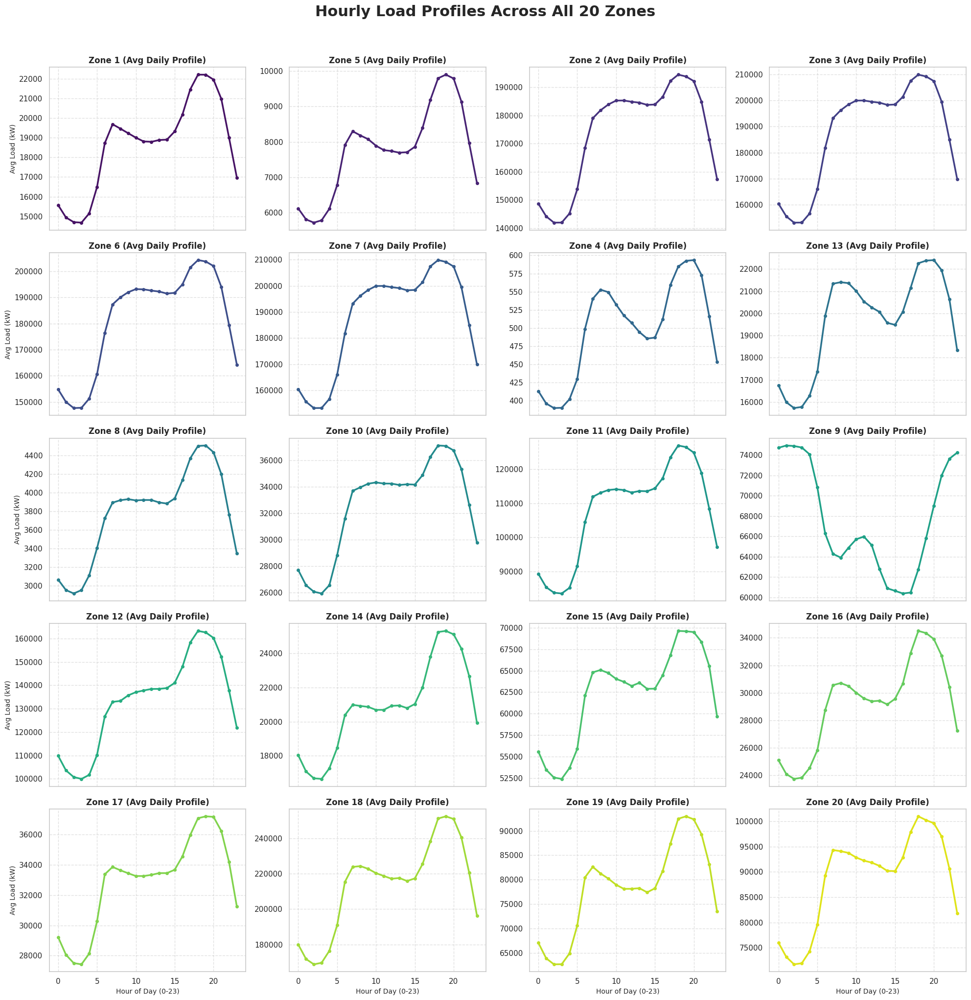

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load and Prepare
df = pd.read_csv('final_training_data_model_ready.csv')
df['ds'] = pd.to_datetime(df['ds'])
df['hour'] = df['ds'].dt.hour

# 2. Calculate Hourly Average per Zone
# We group by zone and hour, then take the mean load
hourly_avg = df.groupby(['zone_id', 'hour'])['load'].mean().reset_index()

# Define the custom order for zones
zones_order = [1, 5, 2, 3, 6, 7, 4, 13, 8, 10, 11, 9, 12, 14, 15, 16, 17, 18, 19, 20]

# 3. Plotting for Zones in specified order
fig, axes = plt.subplots(5, 4, figsize=(20, 20), sharex=True)
axes = axes.flatten()

# Use a professional color palette
colors = sns.color_palette("viridis", 20)

for i, zid in enumerate(zones_order):
    # Filter data for the specific zone
    zone_data = hourly_avg[hourly_avg['zone_id'] == zid]

    # Plot the 24-hour cycle
    axes[i].plot(zone_data['hour'], zone_data['load'],
                 color=colors[i], linewidth=2.5, marker='o', markersize=4)

    # Formatting each subplot
    axes[i].set_title(f'Zone {zid} (Avg Daily Profile)', fontsize=12, fontweight='bold')
    axes[i].grid(True, linestyle='--', alpha=0.6)

    if i % 4 == 0:
        axes[i].set_ylabel('Avg Load (kW)', fontsize=10)
    if i >= 16:
        axes[i].set_xlabel('Hour of Day (0-23)', fontsize=10)

plt.suptitle('Hourly Load Profiles Across All 20 Zones',
             fontsize=22, y=1.02, fontweight='bold')
plt.savefig('pillar_1_hourly_load_all_zones.png', bbox_inches='tight', dpi=300)
plt.tight_layout()
plt.show()

Is pattern same on everyday?

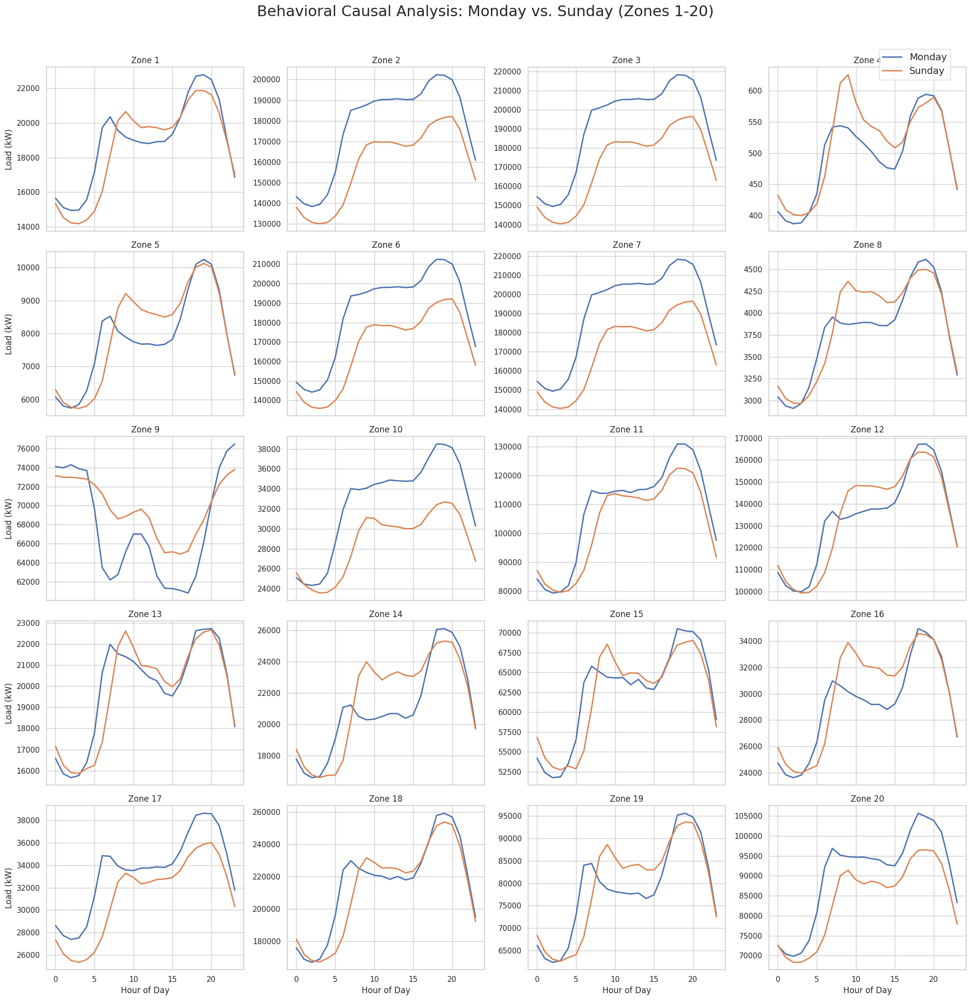

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('final_training_data_model_ready.csv')
df['ds'] = pd.to_datetime(df['ds'])
df['day_name'] = df['ds'].dt.day_name()
df['hour'] = df['ds'].dt.hour  # Create explicit hour column

days_to_compare = ['Monday', 'Sunday']

# 1. Grouping using the explicit 'hour' column
pivot_df = df.groupby(['zone_id', 'day_name', 'hour'])['load'].mean().reset_index()

# 2. Plotting
fig, axes = plt.subplots(5, 4, figsize=(20, 20), sharex=True)
axes = axes.flatten()

for i, zid in enumerate(range(1, 21)):
    zone_subset = pivot_df[pivot_df['zone_id'] == zid]

    for day in days_to_compare:
        day_data = zone_subset[zone_subset['day_name'] == day]
        # Use 'hour' for the x-axis
        axes[i].plot(day_data['hour'], day_data['load'], label=day, linewidth=2)

    axes[i].set_title(f'Zone {zid}', fontsize=12)
    if i % 4 == 0: axes[i].set_ylabel('Load (kW)')
    if i >= 16: axes[i].set_xlabel('Hour of Day')

# Fix legend so it doesn't repeat 20 times
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.98, 0.98), fontsize=14)

plt.suptitle('Behavioral Causal Analysis: Monday vs. Sunday (Zones 1-20)', fontsize=22, y=1.02)
plt.tight_layout()
plt.show()

Analyzing Thermal Signatures for all zones... this may take a minute.


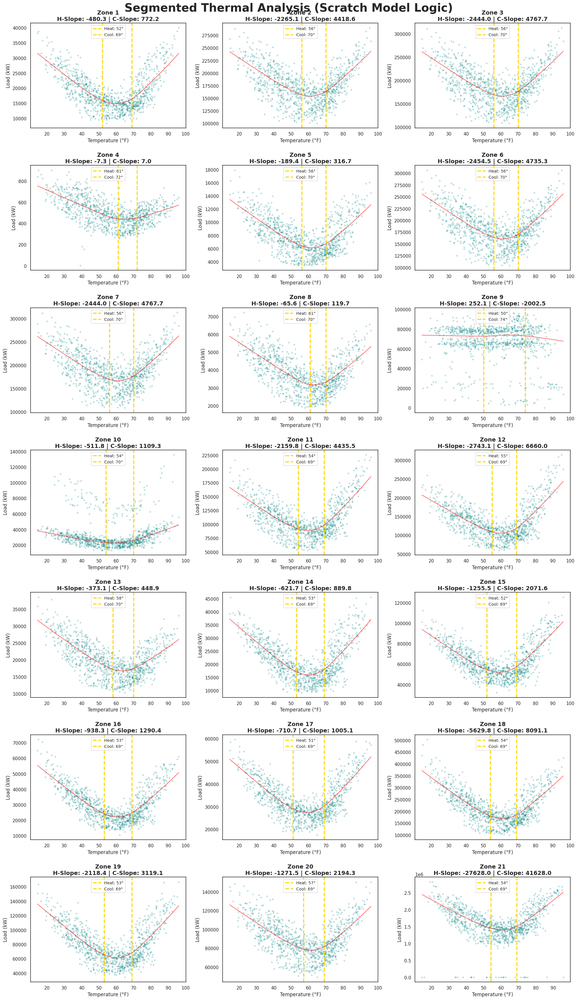


Thermal Parameters saved to 'zone_thermal_signatures.csv'


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load and Setup
# Ensure your filename matches exactly
df = pd.read_csv('final_training_data_model_ready.csv')
df['ds'] = pd.to_datetime(df['ds'])

# Calculate the Physics Baseline (Average of all stations)
temp_cols = [f'temp_s{i}' for i in range(1, 12)]
df['avg_temp'] = df[temp_cols].mean(axis=1)

def find_elbows_and_slopes(zone_df):
    """
    Finds unique elbows by minimizing error across THREE segments:
    Heating Segment, Comfort (Flat) Segment, and Cooling Segment.
    """
    z_data = zone_df.dropna(subset=['load', 'avg_temp']).copy()

    if len(z_data) < 50: # Ensure enough overall data for meaningful analysis
        return np.nan, np.nan, np.nan, np.nan, np.nan

    best_sse = float('inf')
    best_bps = (60, 70) # Default fallback

    # 1. GRID SEARCH FOR UNIQUE ELBOWS
    # We check every combination of T_heating and T_cooling
    for t_h in range(50, 68, 1):    # Heating elbows (finer steps)
        for t_c in range(69, 85, 1):  # Cooling elbows (finer steps)
            if t_h >= t_c: # Ensure heating elbow is always below cooling elbow
                continue

            # Split data into 3 segments based on current test points
            h_seg = z_data[z_data['avg_temp'] <= t_h]
            m_seg = z_data[(z_data['avg_temp'] > t_h) & (z_data['avg_temp'] < t_c)]
            c_seg = z_data[z_data['avg_temp'] >= t_c]

            # Ensure each segment has enough data for meaningful calculations
            if len(h_seg) >= 2 and len(m_seg) >= 2 and len(c_seg) >= 2:
                # Error of Heating Line (Linear fit)
                try:
                    _, res_h, _, _, _ = np.polyfit(h_seg['avg_temp'], h_seg['load'], 1, full=True)

                    # Error of Comfort Zone (Flat fit)
                    # We use the mean because the middle should ideally be a flat baseline
                    res_m = np.sum((m_seg['load'] - m_seg['load'].mean())**2)

                    # Error of Cooling Line (Linear fit)
                    _, res_c, _, _, _ = np.polyfit(c_seg['avg_temp'], c_seg['load'], 1, full=True)

                    # Total SSE for this specific elbow combination
                    total_sse = res_h[0] + res_m + res_c[0]

                    if total_sse < best_sse:
                        best_sse = total_sse
                        best_bps = (t_h, t_c)
                except:
                    pass # If polyfit or mean calculation fails for some reason, treat as high error

    # 2. CALCULATE FINAL PARAMETERS USING THE BEST ELBOWS
    t_h, t_c = best_bps

    h_slope_data = z_data[z_data['avg_temp'] <= t_h]
    c_slope_data = z_data[z_data['avg_temp'] >= t_c]
    m_baseline_data = z_data[(z_data['avg_temp'] > t_h) & (z_data['avg_temp'] < t_c)]

    # Final Slopes (How many kW per degree change)
    h_slope = np.nan
    if len(h_slope_data) >= 2:
        h_slope = np.polyfit(h_slope_data['avg_temp'], h_slope_data['load'], 1)[0]

    c_slope = np.nan
    if len(c_slope_data) >= 2:
        c_slope = np.polyfit(c_slope_data['avg_temp'], c_slope_data['load'], 1)[0]

    # Comfort Baseline (The average load when weather isn't a factor)
    m_baseline = np.nan
    if not m_baseline_data.empty:
        m_baseline = m_baseline_data['load'].mean()

    return t_h, t_c, h_slope, c_slope, m_baseline

# --- 2. EXECUTION AND VISUALIZATION ---

sns.set_theme(style="white")
fig, axes = plt.subplots(7, 3, figsize=(20, 35))
axes = axes.flatten()

all_zone_params = []

print("Analyzing Thermal Signatures for all zones... this may take a minute.")

for i, zone_id in enumerate(range(1, 22)):
    zone_data = df[df['zone_id'] == zone_id].dropna(subset=['load', 'avg_temp'])

    # Get the unique physics for THIS zone
    t_h, t_c, h_s, c_s, m_base = find_elbows_and_slopes(zone_data)

    # Save parameters for the next modeling step
    all_zone_params.append({
        'zone_id': zone_id, 't_heat': t_h, 't_cool': t_c,
        'h_slope': h_s, 'c_slope': c_s, 'base_load': m_base
    })

    # Sample data for plot clarity
    sample = zone_data.sample(min(len(zone_data), 1000), random_state=42) if len(zone_data) > 1000 else zone_data

    # Plot Scatter
    axes[i].scatter(sample['avg_temp'], sample['load'], alpha=0.2, color='teal', s=10)

    # Plot the Yellow Elbow Markers
    if not pd.isna(t_h):
        axes[i].axvline(t_h, color='#FFD700', linestyle='--', linewidth=2.5, label=f'Heat: {t_h}°')
    if not pd.isna(t_c):
        axes[i].axvline(t_c, color='#FFD700', linestyle='--', linewidth=2.5, label=f'Cool: {t_c}°')

    # Plot a reference LOWESS curve to see if our elbows match the data bend
    sns.regplot(data=sample, x='avg_temp', y='load', scatter=False,
                lowess=True, ax=axes[i], line_kws={'color': 'red', 'linewidth': 1.5, 'alpha': 0.6})

    # Formatting
    axes[i].set_title(f'Zone {zone_id}\nH-Slope: {h_s:.1f} | C-Slope: {c_s:.1f}',
                      fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Temperature (°F)')
    axes[i].set_ylabel('Load (kW)')
    axes[i].legend(loc='upper center', frameon=True, fontsize='small')

plt.tight_layout()
plt.subplots_adjust(top=0.96)
fig.suptitle('Segmented Thermal Analysis (Scratch Model Logic)', fontsize=28, fontweight='bold')
plt.savefig('Pillar2_Thermal_Signatures.png', dpi=300)
plt.show()

# Export parameters to a CSV for your final model calculations
params_df = pd.DataFrame(all_zone_params)
params_df.to_csv('zone_thermal_signatures.csv', index=False)
print("\nThermal Parameters saved to 'zone_thermal_signatures.csv'")

In [6]:
import pandas as pd
df = pd.read_csv('zone_thermal_signatures.csv')
print(df.head())


   zone_id  t_heat  t_cool      h_slope      c_slope      base_load
0        1      52      69  -480.338874   772.246206   14343.522423
1        2      56      70 -2265.086286  4418.579612  148650.319320
2        3      56      70 -2444.033381  4767.657185  160394.007553
3        4      61      72    -7.334259     6.979558     413.344056
4        5      56      70  -189.402115   316.716037    5804.087358


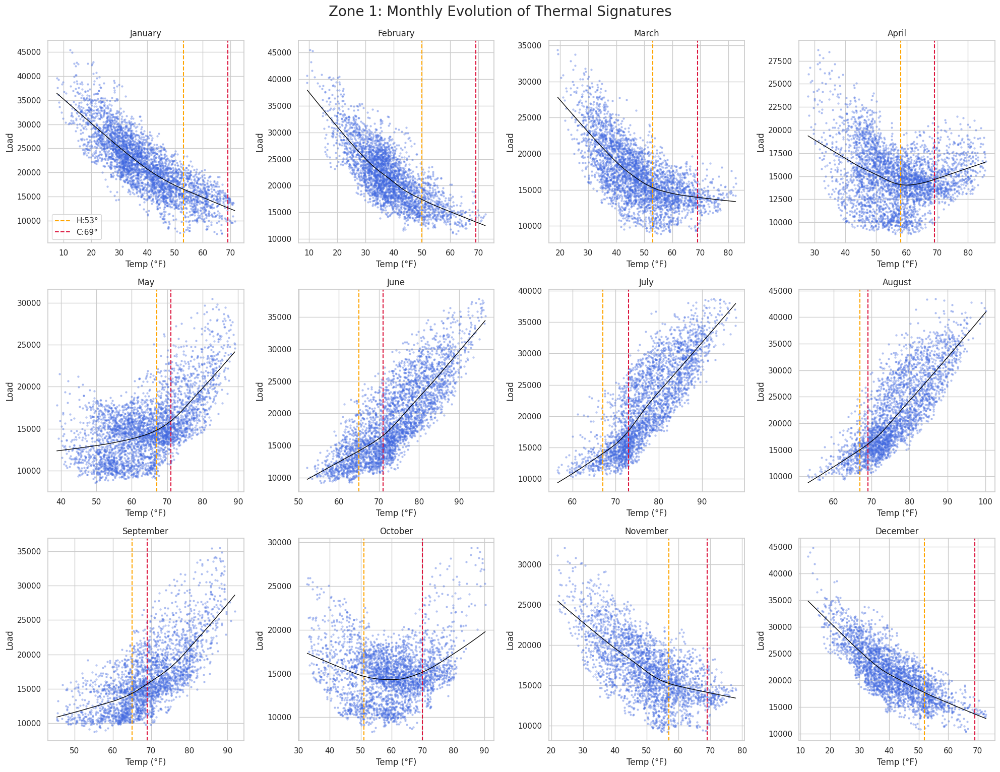

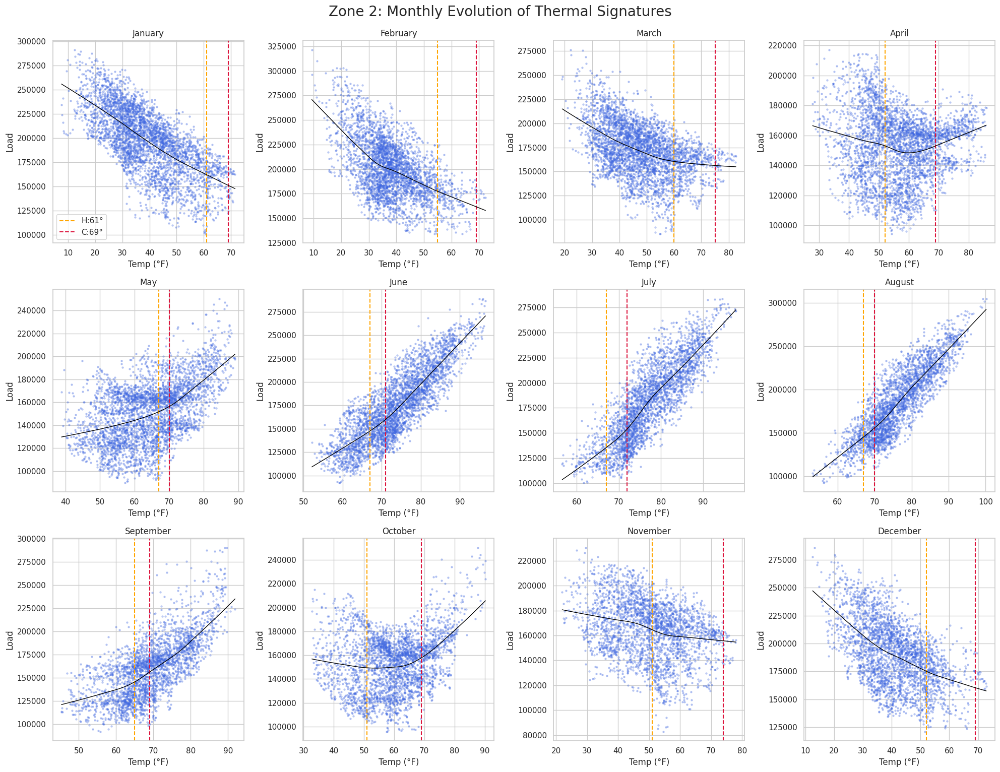

KeyboardInterrupt: 

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load your data
df = pd.read_csv('cleaned_load_history_with_weights.csv')
df['ds'] = pd.to_datetime(df['ds'])

# Assuming df is already loaded and 'ds' is datetime
df['month'] = df['ds'].dt.month
df['month_name'] = df['ds'].dt.month_name()

# Recalculate avg_temp for df as it might not be present after reloading from cleaned_load_history_with_weights.csv
temp_cols = [f'temp_s{i}' for i in range(1, 12)]
df['avg_temp'] = df[temp_cols].mean(axis=1)

# Define find_elbows_and_slopes function (re-added as it was deleted)
def find_elbows_and_slopes(zone_df):
    """
    Finds unique elbows by minimizing error across THREE segments:
    Heating Segment, Comfort (Flat) Segment, and Cooling Segment.
    """
    z_data = zone_df.dropna(subset=['load', 'avg_temp']).copy()

    if len(z_data) < 50: # Ensure enough overall data for meaningful analysis
        return np.nan, np.nan, np.nan, np.nan, np.nan

    best_sse = float('inf')
    best_bps = (60, 70) # Default fallback

    # 1. GRID SEARCH FOR UNIQUE ELBOWS
    # We check every combination of T_heating and T_cooling
    for t_h in range(50, 68, 1):    # Heating elbows (finer steps)
        for t_c in range(69, 85, 1):  # Cooling elbows (finer steps)
            if t_h >= t_c: # Ensure heating elbow is always below cooling elbow
                continue

            # Split data into 3 segments based on current test points
            h_seg = z_data[z_data['avg_temp'] <= t_h]
            m_seg = z_data[(z_data['avg_temp'] > t_h) & (z_data['avg_temp'] < t_c)]
            c_seg = z_data[z_data['avg_temp'] >= t_c]

            # Ensure each segment has enough data for meaningful calculations
            if len(h_seg) >= 2 and len(m_seg) >= 2 and len(c_seg) >= 2:
                # Error of Heating Line (Linear fit)
                try:
                    _, res_h, _, _, _ = np.polyfit(h_seg['avg_temp'], h_seg['load'], 1, full=True)

                    # Error of Comfort Zone (Flat fit)
                    # We use the mean because the middle should ideally be a flat baseline
                    res_m = np.sum((m_seg['load'] - m_seg['load'].mean())**2)

                    # Error of Cooling Line (Linear fit)
                    _, res_c, _, _, _ = np.polyfit(c_seg['avg_temp'], c_seg['load'], 1, full=True)

                    # Total SSE for this specific elbow combination
                    total_sse = res_h[0] + res_m + res_c[0]

                    if total_sse < best_sse:
                        best_sse = total_sse
                        best_bps = (t_h, t_c)
                except:
                    pass # If polyfit or mean calculation fails for some reason, treat as high error

    # 2. CALCULATE FINAL PARAMETERS USING THE BEST ELBOWS
    t_h, t_c = best_bps

    h_slope_data = z_data[z_data['avg_temp'] <= t_h]
    c_slope_data = z_data[z_data['avg_temp'] >= t_c]
    m_baseline_data = z_data[(z_data['avg_temp'] > t_h) & (z_data['avg_temp'] < t_c)]

    # Final Slopes (How many kW per degree change)
    h_slope = np.nan
    if len(h_slope_data) >= 2:
        h_slope = np.polyfit(h_slope_data['avg_temp'], h_slope_data['load'], 1)[0]

    c_slope = np.nan
    if len(c_slope_data) >= 2:
        c_slope = np.polyfit(c_slope_data['avg_temp'], c_slope_data['load'], 1)[0]

    # Comfort Baseline (The average load when weather isn't a factor)
    m_baseline = np.nan
    if not m_baseline_data.empty:
        m_baseline = m_baseline_data['load'].mean()

    return t_h, t_c, h_slope, c_slope, m_baseline

# 2. Visualizing Monthly Shifting Signatures for a Specific Zone
# Let's pick Zone 1 as an example; you can loop this for all zones
# Changed target_zone to iterate over all zones
for target_zone in range(1, 22):
    zone_df = df[df['zone_id'] == target_zone]

    plt.figure(figsize=(20, 15))
    sns.set_theme(style="whitegrid")

    for month in range(1, 13):
        plt.subplot(3, 4, month)
        m_data = zone_df[zone_df['month'] == month]

        if len(m_data) > 0:
            # Plot Scatter
            plt.scatter(m_data['avg_temp'], m_data['load'], alpha=0.3, s=5, color='royalblue')

            # Calculate monthly elbows
            try:
                t_h, t_c, h_s, c_s, m_base = find_elbows_and_slopes(m_data)

                # Plot Elbow Lines
                if not pd.isna(t_h):
                    plt.axvline(t_h, color='orange', linestyle='--', label=f'H:{t_h}°')
                if not pd.isna(t_c):
                    plt.axvline(t_c, color='crimson', linestyle='--', label=f'C:{t_c}°')

                # Add a trend line to see the shape
                sns.regplot(data=m_data, x='avg_temp', y='load', scatter=False,
                            lowess=True, line_kws={'color': 'black', 'linewidth': 1})
            except:
                pass # In case a month doesn't have enough variance for a fit or other error

        plt.title(f"{m_data['month_name'].iloc[0] if not m_data.empty else f'Month {month}'}")
        plt.xlabel('Temp (°F)')
        plt.ylabel('Load')
        if month == 1: plt.legend()

    plt.tight_layout()
    plt.suptitle(f'Zone {target_zone}: Monthly Evolution of Thermal Signatures', fontsize=20, y=1.02)
    plt.show()

In [1]:
# Create a copy for analysis
import pandas as pd
df = pd.read_csv('cleaned_load_history_with_weights.csv')
temp_cols = [f'temp_s{i}' for i in range(1, 12)]
df['avg_temp'] = df[temp_cols].mean(axis=1)
lag_df = df.copy().sort_values(['zone_id', 'ds'])

# 1. Momentum Cause (Immediate past)
lag_df['load_lag_1h'] = lag_df.groupby('zone_id')['load'].shift(1)

# 2. Routine Cause (Same time yesterday)
lag_df['load_lag_24h'] = lag_df.groupby('zone_id')['load'].shift(24)

# 3. Weekly Routine (Same time last week)
lag_df['load_lag_168h'] = lag_df.groupby('zone_id')['load'].shift(168)

# 4. Thermal Memory (Rolling temperature causes)
# This represents the building 'soaking up' heat
lag_df['temp_roll_3h'] = lag_df.groupby('zone_id')['avg_temp'].transform(lambda x: x.rolling(3).mean())
lag_df['temp_roll_24h'] = lag_df.groupby('zone_id')['avg_temp'].transform(lambda x: x.rolling(24).mean())

# Drop NAs created by shifting
lag_df = lag_df.dropna()

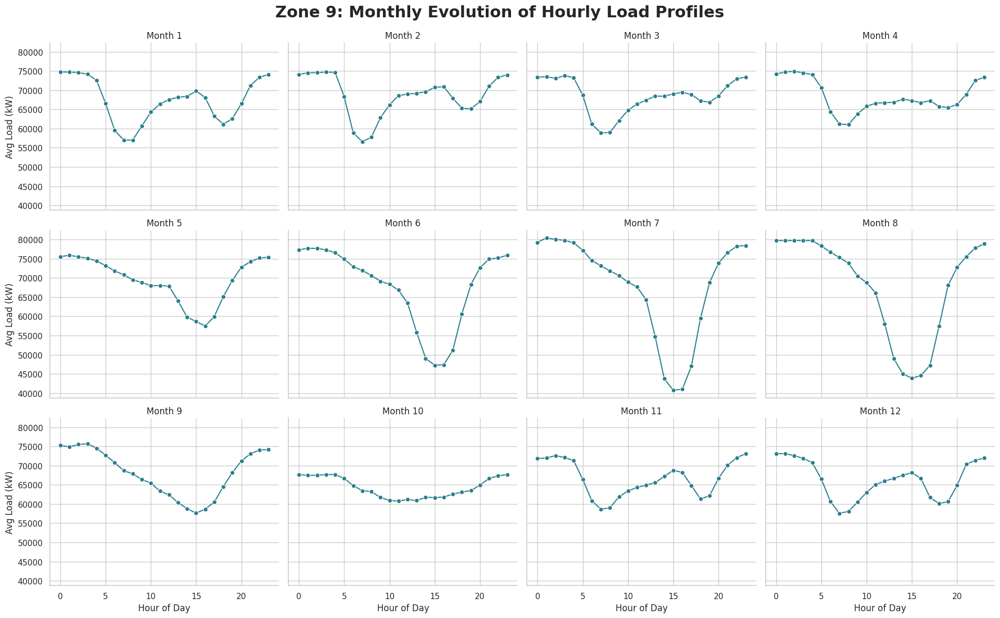

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset to ensure a consistent state for this cell
df = pd.read_csv('final_training_data_model_ready.csv')
# Ensure 'ds' is datetime.
df['ds'] = pd.to_datetime(df['ds'])

# 1. Filter for Zone 9 and prepare time features
z9_data = df[df['zone_id'] == 9].copy()
z9_data['hour'] = z9_data['ds'].dt.hour
z9_data['month'] = z9_data['ds'].dt.month
z9_data['month_name'] = z9_data['ds'].dt.month_name()

# 2. Setup the Visualization (FacetGrid)
# We use a 3x4 grid to show all 12 months at once
sns.set_theme(style="whitegrid")
g = sns.FacetGrid(z9_data, col="month", col_wrap=4, height=4, aspect=1.2)

# 3. Map the Lineplot to each month
# This mimics the "Avg Daily Profile" look for every month
g.map(sns.lineplot, "hour", "load", marker='o', color='#2a7f8e', errorbar=None)

# 4. Formatting and Labels
g.set_axis_labels("Hour of Day", "Avg Load (kW)")
g.set_titles(col_template="Month {col_name}")

plt.subplots_adjust(top=0.92)
g.fig.suptitle('Zone 9: Monthly Evolution of Hourly Load Profiles',
               fontsize=22, fontweight='bold')

plt.show()

In [3]:
df = pd.read_csv('final_training_data_model_ready.csv')
print(df.columns)


Index(['ds', 'zone_id', 'load', 'weight', 'temp_s1', 'temp_s2', 'temp_s3',
       'temp_s4', 'temp_s5', 'temp_s6', 'temp_s7', 'temp_s8', 'temp_s9',
       'temp_s10', 'temp_s11', 'mapped_station_id', 'mapped_temp',
       'is_holiday', 'is_weekend', 'day_0', 'day_1', 'day_2', 'day_3', 'day_4',
       'day_5', 'day_6'],
      dtype='object')


In [4]:
import pandas as pd
import numpy as np

# 1. Load the signature data
signatures_df = pd.read_csv('zone_thermal_signatures.csv')
model_ready_df = pd.read_csv('final_training_data_model_ready.csv')

def prepare_data_for_causal_suite(df, sigs):
    df = df.copy()

    # Ensure ds is datetime and extract time features
    df['ds'] = pd.to_datetime(df['ds'])
    df['hour'] = df['ds'].dt.hour
    df['dayofweek'] = df['ds'].dt.dayofweek
    df['month'] = df['ds'].dt.month

    # --- UPDATED: Calculate Average Temp from all sensors ---
    temp_cols = [f'temp_s{i}' for i in range(1, 12) if f'temp_s{i}' in df.columns]
    df['avg_temp'] = df[temp_cols].mean(axis=1)

    # 2. Merge signatures for zone-specific thresholds
    df = df.merge(sigs[['zone_id', 't_heat', 't_cool']], on='zone_id', how='left')

    # 3. Calculate CDH and HDH using avg_temp
    # CDH: Cooling Degree Hours (Temp - Threshold)
    df['cdh'] = (df['avg_temp'] - df['t_cool']).clip(lower=0)
    # HDH: Heating Degree Hours (Threshold - Temp)
    df['hdh'] = (df['t_heat'] - df['avg_temp']).clip(lower=0)

    # 4. Create Lags (Grouped by zone)
    df = df.sort_values(['zone_id', 'ds'])
    df['load_lag_1h'] = df.groupby('zone_id')['load'].shift(1)
    df['load_lag_24h'] = df.groupby('zone_id')['load'].shift(24)
    df['load_lag_168h'] = df.groupby('zone_id')['load'].shift(168)
    cols_to_check = ['load', 'cdh', 'hdh', 'load_lag_1h', 'load_lag_24h', 'load_lag_168h']
    df = df.replace([np.inf, -np.inf], np.nan)
    df = df.dropna(subset=cols_to_check)

    return df.reset_index(drop=True)


processed_df = prepare_data_for_causal_suite(model_ready_df, signatures_df)

processed_filename = 'final_processed_data_with_avg_temp.csv'
processed_df.to_csv(processed_filename, index=False)

In [5]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

def calculate_wmape(y_true, y_pred):
    """Calculates Weighted Mean Absolute Percentage Error."""
    # sum(|actual - pred|) / sum(|actual|)
    return np.sum(np.abs(y_true - y_pred)) / np.sum(np.abs(y_true))

def evaluate_prediction_performance(df, n_weeks=8):
    # 1. Temporal Split (Backtesting)
    df = df.sort_values('ds').reset_index(drop=True)
    max_date = df['ds'].max()
    split_date = max_date - pd.Timedelta(weeks=n_weeks)

    # 2. Define Features & Target
    features = ['cdh', 'hdh', 'hour', 'dayofweek', 'month', 'load_lag_1h', 'load_lag_24h', 'load_lag_168h']
    target = 'load'

    train_data = df[df['ds'] <= split_date].dropna()
    test_data = df[df['ds'] > split_date].dropna()

    print(f"\n--- Prediction Performance (Last {n_weeks} Weeks) ---")
    # Updated Header
    print(f"{'Zone':<10} | {'MAE':<12} | {'WMAPE':<10}")
    print("-" * 40)

    all_zone_metrics = []

    for zone_id in sorted(df['zone_id'].unique()):
        # Isolate zone data
        z_train = train_data[train_data['zone_id'] == zone_id]
        z_test = test_data[test_data['zone_id'] == zone_id]

        if z_test.empty or z_train.empty:
            continue

        # 3. Model Configuration
        model = RandomForestRegressor(
            n_estimators=100,
            max_depth=10,
            random_state=42,
            n_jobs=-1
        )

        # 4. Train and Predict
        model.fit(z_train[features], z_train[target])
        preds = model.predict(z_test[features])

        # 5. Calculate Metrics (MAE and WMAPE)
        mae = mean_absolute_error(z_test[target], preds)
        wmape = calculate_wmape(z_test[target].values, preds)

        all_zone_metrics.append({'mae': mae, 'wmape': wmape})

        # Print results for the zone
        print(f"Zone {zone_id:<5} | {mae:>12.2f} | {wmape:>10.2%}")

    # 6. Global System Average
    if all_zone_metrics:
        avg_mae = np.mean([m['mae'] for m in all_zone_metrics])
        avg_wmape = np.mean([m['wmape'] for m in all_zone_metrics])
        print("-" * 40)
        print(f"OVERALL    | {avg_mae:>12.2f} | {avg_wmape:>10.2%}")

# Load the dataframe needed for evaluation
model_ready_df = pd.read_csv('final_processed_data_with_avg_temp.csv')

# Execute the evaluation
model_ready_df['ds'] = pd.to_datetime(model_ready_df['ds'])
# Execute the evaluation
model_ready_df['ds'] = pd.to_datetime(model_ready_df['ds'])
evaluate_prediction_performance(model_ready_df)


--- Prediction Performance (Last 8 Weeks) ---
Zone       | MAE          | WMAPE     
----------------------------------------
Zone 1     |       453.17 |      2.51%
Zone 2     |      2644.19 |      1.58%
Zone 3     |      2853.79 |      1.59%
Zone 4     |        15.72 |      3.62%
Zone 5     |       225.96 |      3.38%
Zone 6     |      2727.44 |      1.57%
Zone 7     |      2853.79 |      1.59%
Zone 8     |       100.29 |      2.93%
Zone 9     |      4063.72 |      6.17%
Zone 10    |      2907.60 |      3.83%
Zone 11    |      2206.71 |      2.01%
Zone 12    |      3193.66 |      2.37%
Zone 13    |       705.36 |      4.16%
Zone 14    |       925.68 |      4.59%
Zone 15    |      2315.42 |      3.92%
Zone 16    |       963.01 |      3.61%
Zone 17    |       814.67 |      2.44%
Zone 18    |      6246.80 |      3.06%
Zone 19    |      3078.29 |      4.14%
Zone 20    |      2351.67 |      2.72%
Zone 21    |     31383.77 |      1.92%
----------------------------------------
OVERALL    | 

In [16]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from scipy.stats import f_oneway

def run_causal_analysis_by_zone(df):
    outcome = 'load'
    treatments = ['cdh', 'hdh', 'is_holiday']
    confounders = ['hour', 'dayofweek', 'month', 'is_weekend', 'load_lag_1h', 'load_lag_24h', 'load_lag_168h']

    zones = sorted(df['zone_id'].unique())
    results = []

    print(f"{'Zone':<7} | {'CDH':<10} | {'HDH':<10} | {'Holiday':<10} | {'P-Value':<8}")
    print("-" * 65)

    for zone in zones:
        z_df = df[df['zone_id'] == zone].copy()
        if len(z_df) < 100: continue

        try:
            z_df['environment'] = pd.qcut(z_df['avg_temp'], q=3, labels=['Cold', 'Mild', 'Hot'])
        except ValueError: continue

        X_conf = z_df[confounders].values
        Y_outcome = z_df[outcome].values.reshape(-1, 1)
        T_treatments = z_df[treatments].values

        resid_l = LinearRegression().fit(X_conf, Y_outcome)
        L_prime = Y_outcome - resid_l.predict(X_conf)
        resid_t = LinearRegression().fit(X_conf, T_treatments)
        T_prime = T_treatments - resid_t.predict(X_conf)

        causal_model = LinearRegression(fit_intercept=False)
        causal_model.fit(T_prime, L_prime)
        gamma = causal_model.coef_[0]

        z_df['resid'] = L_prime - causal_model.predict(T_prime)
        env_resids = [z_df[z_df['environment'] == e]['resid'].values for e in z_df['environment'].unique()]
        _, p_val = f_oneway(*env_resids)

        print(f"Zone {zone:<2} | {gamma[0]:>10.2f} | {gamma[1]:>10.2f} | {gamma[2]:>10.2f} | {p_val:>8.9f}")

        results.append({
            'zone_id': zone,
            'gamma_cdh': gamma[0], 'gamma_hdh': gamma[1], 'gamma_holiday': gamma[2],
            'p_value': p_val, 'is_invariant': p_val > 0.05
        })

    return pd.DataFrame(results)

# Run and store coefficients
zone_causal_results = run_causal_analysis_by_zone(model_ready_df)

Zone    | CDH        | HDH        | Holiday    | P-Value 
-----------------------------------------------------------------
Zone 1  |     158.09 |      90.27 |      48.32 | 0.000000000
Zone 2  |     589.09 |     250.42 |   -2283.93 | 0.000012089
Zone 3  |     635.63 |     270.20 |   -2464.37 | 0.000012090
Zone 4  |       1.46 |       0.68 |       7.05 | 0.000005067
Zone 5  |      65.74 |      31.93 |      59.55 | 0.000000000
Zone 6  |     661.16 |     285.01 |   -2342.21 | 0.000003064
Zone 7  |     635.63 |     270.20 |   -2464.37 | 0.000012090
Zone 8  |      17.63 |       6.36 |      25.39 | 0.000000186
Zone 9  |    -299.96 |     -56.70 |     364.49 | 0.000000000
Zone 10 |     100.67 |      41.40 |    -354.37 | 0.000024281
Zone 11 |     757.41 |     363.20 |    -597.16 | 0.000000000
Zone 12 |    1219.95 |     504.53 |     591.20 | 0.000000000
Zone 13 |      83.38 |      56.22 |      86.54 | 0.000001866
Zone 14 |     231.14 |     141.49 |     202.38 | 0.012007985
Zone 15 |     486.13 |